# Smajic 2021 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Smajic et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

### Loading libraries
Using sc2_seurat environment

In [3]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [4]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
smajic_merge_doublet = '/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data/smajic_doublets_merge_base.h5ad'
files = [smajic_merge_doublet]
names = ['smajic_merge_doublet']
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i])
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_smajic_merge_doublet  is loaded


In [6]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [7]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [12]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base'
SRR12621867=f'{path}smajic_{suffix}_SRR12621867.h5ad'
SRR12621868=f'{path}smajic_{suffix}_SRR12621868.h5ad'
SRR12621869=f'{path}smajic_{suffix}_SRR12621869.h5ad'
SRR12621870=f'{path}smajic_{suffix}_SRR12621870.h5ad'
SRR12621871=f'{path}smajic_{suffix}_SRR12621871.h5ad'
SRR12621872=f'{path}smajic_{suffix}_SRR12621872.h5ad'

In [9]:
files = [SRR12621867,SRR12621868,SRR12621869,SRR12621870,SRR12621871,SRR12621872]

In [10]:
names = [name.split('.h5ad')[0].split('processed_')[1] for name in files ]
print(names)

['smajic_base_SRR12621867', 'smajic_base_SRR12621868', 'smajic_base_SRR12621869', 'smajic_base_SRR12621870', 'smajic_base_SRR12621871', 'smajic_base_SRR12621872']


In [13]:
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_smajic_base_SRR12621867_preprocessed  is loaded
adata_smajic_base_SRR12621868_preprocessed  is loaded
adata_smajic_base_SRR12621869_preprocessed  is loaded
adata_smajic_base_SRR12621870_preprocessed  is loaded
adata_smajic_base_SRR12621871_preprocessed  is loaded
adata_smajic_base_SRR12621872_preprocessed  is loaded


In [14]:
suffix =['_7','_9','_8','_5','_6','_4']
for i in range(numberobj):
    locals()[object_names_merged[i]].obs_names= [name + suffix[i] if name[-1]=='1' else name for name in locals()[object_names_merged[i]].obs_names ]

## Merge
Merging needs to happen in a certain order to match the row names with the metadata \
GSM4774936	C1: -1_7 \
GSM4774937	C2: -1_9 \
GSM4774938	C3 -1_8 \
GSM4774939	C4 -1_5 \
GSM4774940	C5 -1_6 \
GSM4774941	C6 -1_4

In [16]:
adata_smajic_merge=ad.concat([adata_smajic_base_SRR12621867_preprocessed,adata_smajic_base_SRR12621868_preprocessed,adata_smajic_base_SRR12621869_preprocessed,adata_smajic_base_SRR12621870_preprocessed,adata_smajic_base_SRR12621871_preprocessed,adata_smajic_base_SRR12621872_preprocessed],  join="outer", fill_value=0)


In [17]:
smajic_metadata = sc.read_csv('/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/smajic_2021/metadata/IPDCO_hg_midbrain_cell.tsv',delimiter='\t',first_column_names=True, dtype=str)
print('smajic_metadata is loaded')

smajic_metadata is loaded


In [18]:
smajic_metadata.raw = smajic_metadata.copy()
subset_smajic = smajic_metadata[smajic_metadata.obs_names.isin(adata_smajic_merge.obs_names)]

In [19]:
original_celltype =list()
except_counter=0
for obs_name in adata_smajic_merge.obs_names:
    try:
        value= np.where(subset_smajic.obs_names ==obs_name)[0][0]
        original_celltype.append(subset_smajic.X[value,0])
    except:
        except_counter+=1
        original_celltype.append('None')
    


In [20]:
print(except_counter)

7216


In [21]:
adata_smajic_merge.obs['original_celltype']= original_celltype

In [22]:
adata_smajic_merge.write(os.path.join('./data/smajic_base_merge_base.h5ad'))


In [23]:
print(adata_smajic_merge.raw.X)

  (0, 34845)	2
  (0, 34826)	1
  (0, 7359)	1
  (0, 26546)	1
  (0, 32267)	1
  (0, 33724)	5
  (0, 33725)	1
  (0, 15170)	3
  (0, 28312)	3
  (0, 34880)	3
  (0, 13359)	9
  (0, 24599)	1
  (0, 18411)	5
  (0, 17534)	3
  (0, 24322)	4
  (0, 16406)	1
  (0, 18471)	2
  (0, 20305)	1
  (0, 18467)	4
  (0, 7754)	1
  (0, 17766)	4
  (0, 31212)	1
  (0, 34585)	1
  (0, 21292)	1
  (0, 27298)	4
  :	:
  (29494, 33369)	1
  (29494, 11427)	1
  (29494, 31507)	1
  (29494, 17531)	1
  (29494, 14275)	1
  (29494, 23277)	1
  (29494, 35186)	1
  (29494, 24031)	1
  (29494, 31008)	2
  (29494, 22285)	1
  (29494, 27271)	1
  (29494, 25726)	1
  (29494, 23687)	1
  (29494, 17041)	1
  (29494, 28051)	1
  (29494, 23463)	4
  (29494, 19182)	1
  (29494, 8282)	1
  (29494, 35844)	1
  (29494, 35053)	1
  (29494, 12569)	1
  (29494, 17095)	2
  (29494, 34961)	1
  (29494, 28695)	1
  (29494, 27713)	1


## All data

pca again

In [24]:
object_names_merged = ['adata_merge']
names = ['smajic_merge']
path='/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data'
files=[f'{path}/smajic_base_merge_base.h5ad']

numberobj=1
for i in range(numberobj):
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_merge  is loaded


In [25]:
#To make reproducible plots
np.random.seed(41)

In [7]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

smajic_merge_doublet


In [8]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

smajic_merge_doublet


smajic_merge_doublet


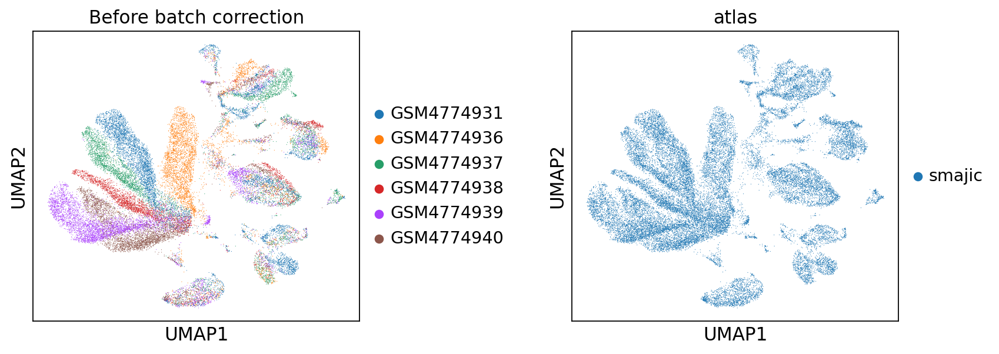

In [9]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

smajic_merge_doublet


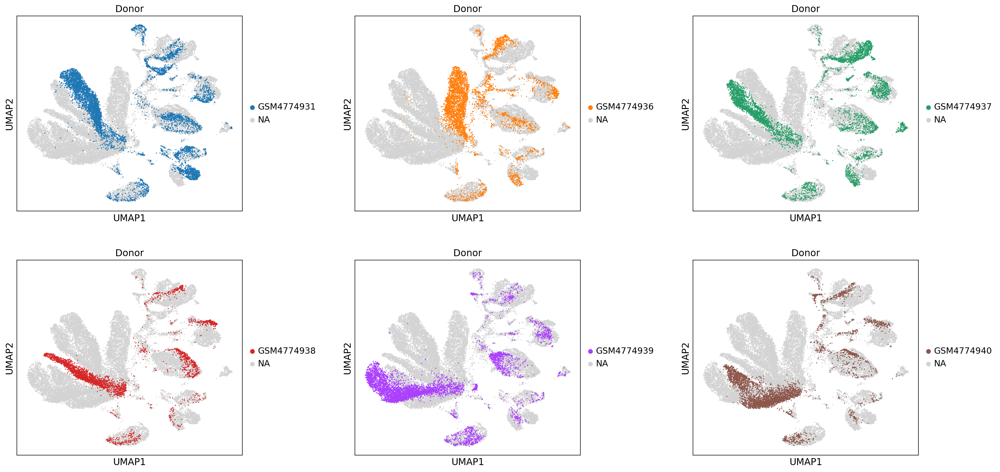

In [10]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(2, 3, figsize = [24,12])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774931', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774936', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774937', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774938', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774939', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'GSM4774940', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

smajic_doublets


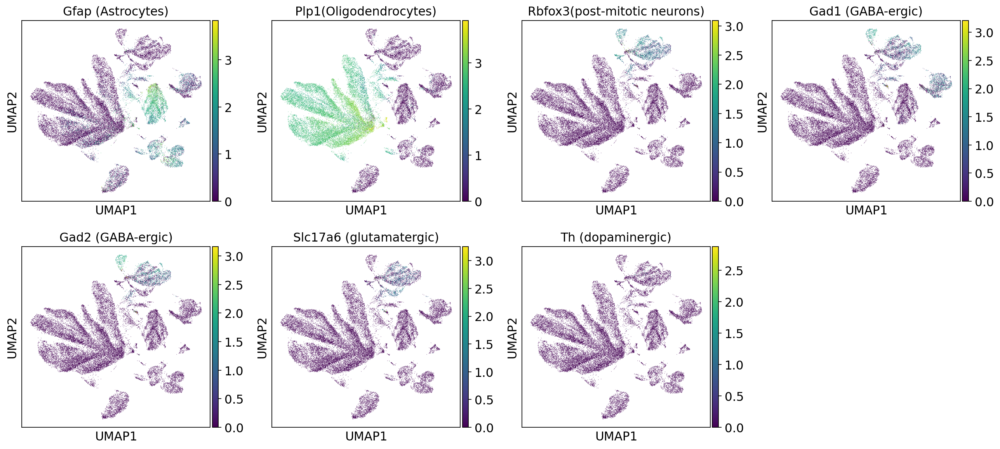

In [54]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [26]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_smajic_merge_full_BC  is loaded


In [27]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

smajic_merge


In [28]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['sample'])

smajic_merge


2023-09-21 15:59:50,040 - harmonypy - INFO - Iteration 1 of 10
2023-09-21 15:59:55,614 - harmonypy - INFO - Iteration 2 of 10
2023-09-21 16:00:01,260 - harmonypy - INFO - Iteration 3 of 10
2023-09-21 16:00:06,864 - harmonypy - INFO - Iteration 4 of 10
2023-09-21 16:00:12,373 - harmonypy - INFO - Converged after 4 iterations


smajic_merge


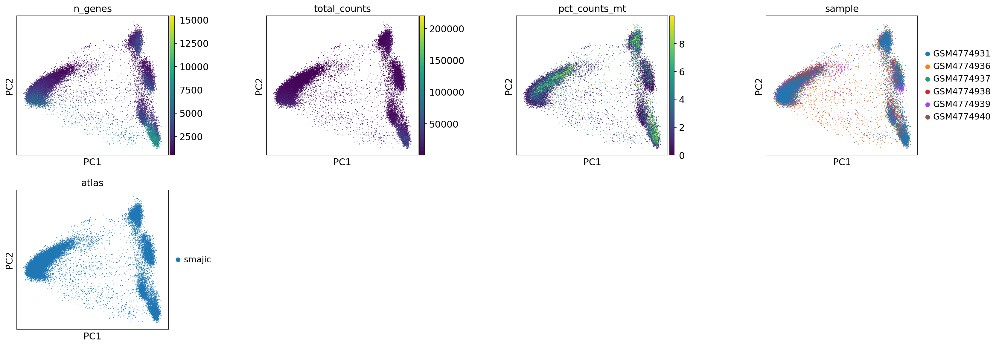

In [29]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


smajic_merge


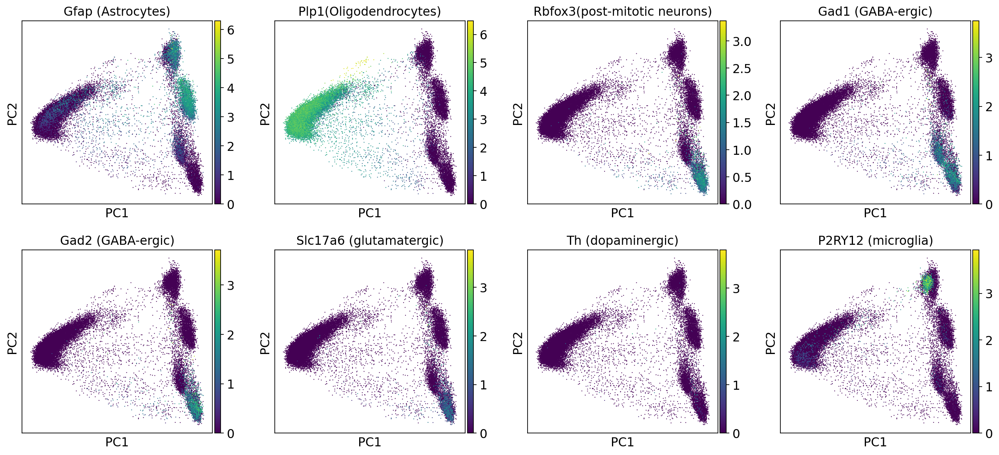

In [30]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [31]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

smajic_merge


smajic_merge


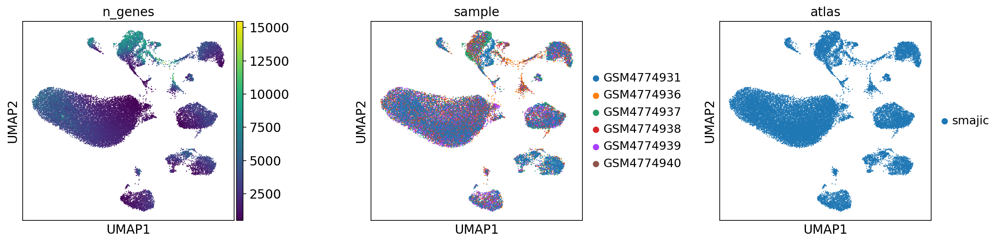

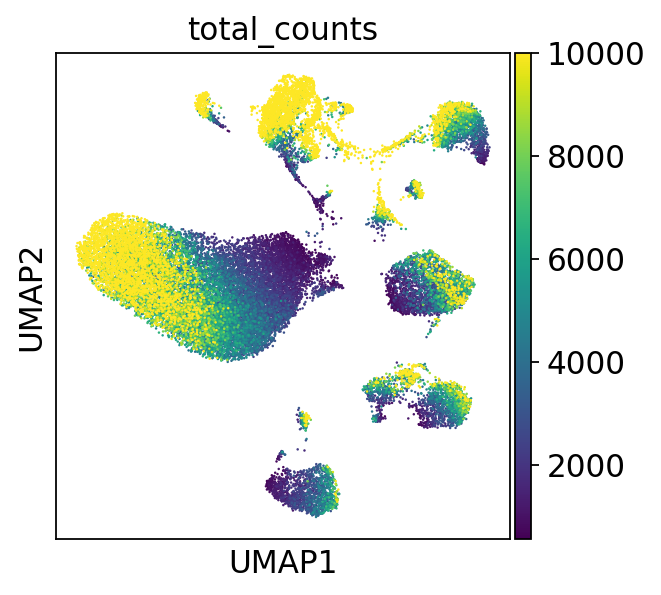

In [32]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

smajic_merge


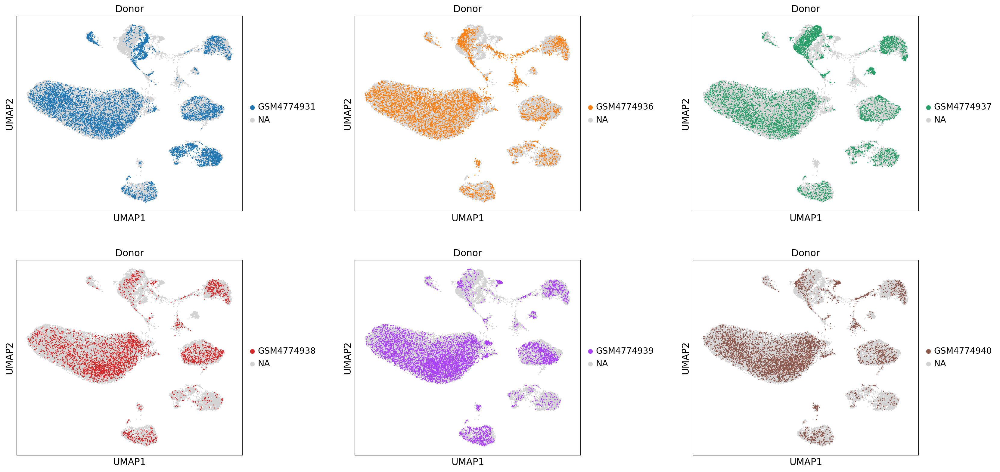

In [33]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(2, 3, figsize = [24,12])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774931', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774936', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774937', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774938', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774939', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'GSM4774940', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_BC_subplots.png',bbox_inches='tight')

smajic_merge


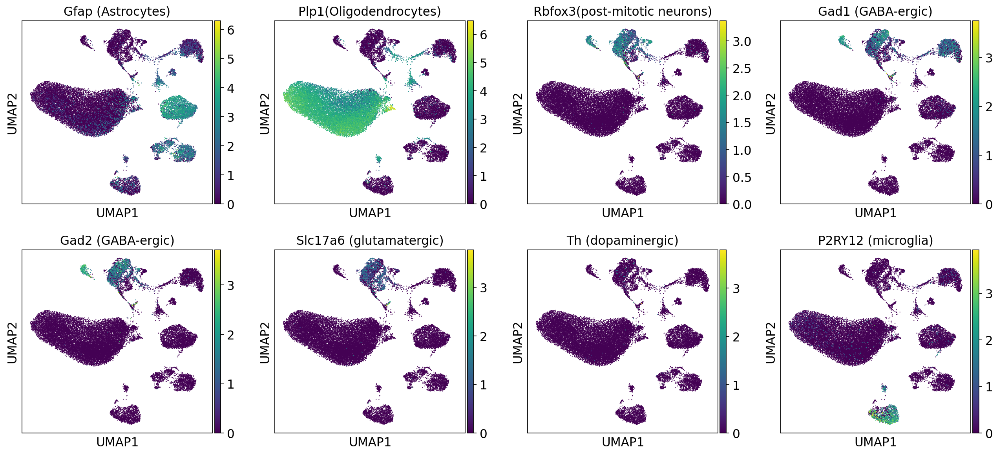

In [34]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

smajic_merge


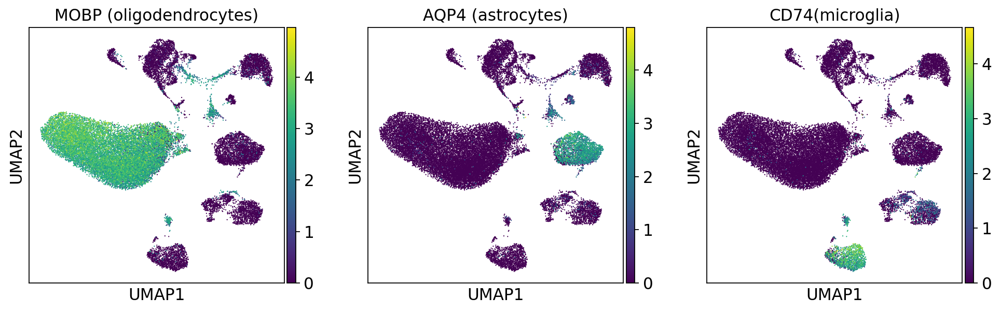

In [35]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['MOBP','AQP4', 'CD74' ],use_raw=False,title=['MOBP (oligodendrocytes)','AQP4 (astrocytes)','CD74(microglia)'])

smajic_merge


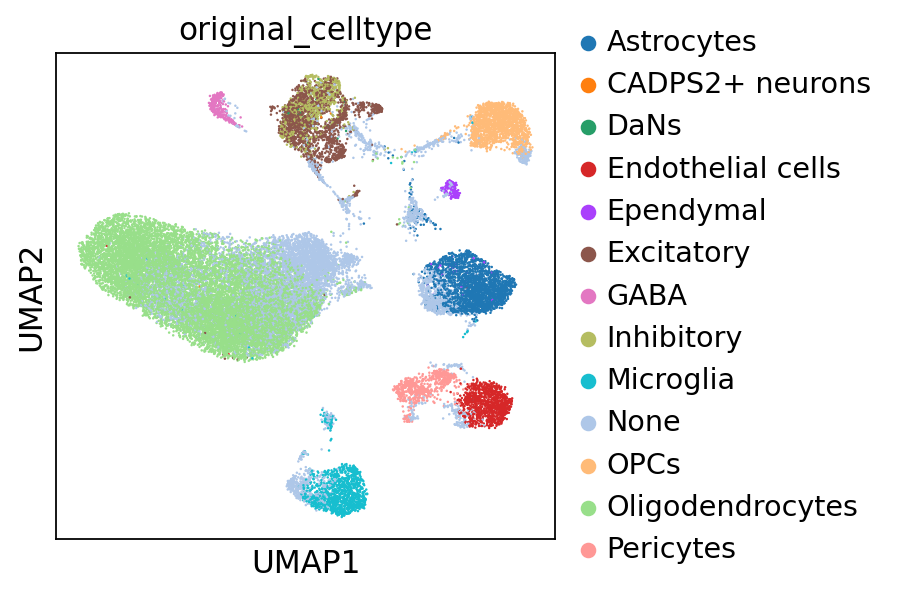

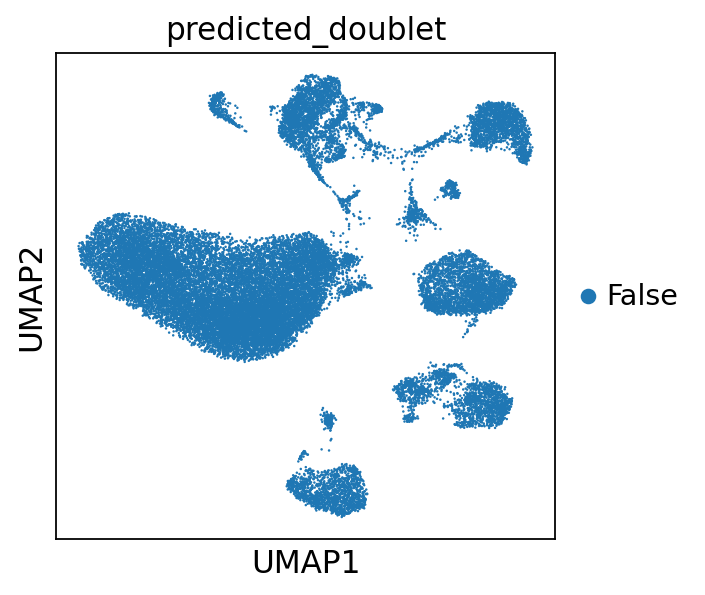

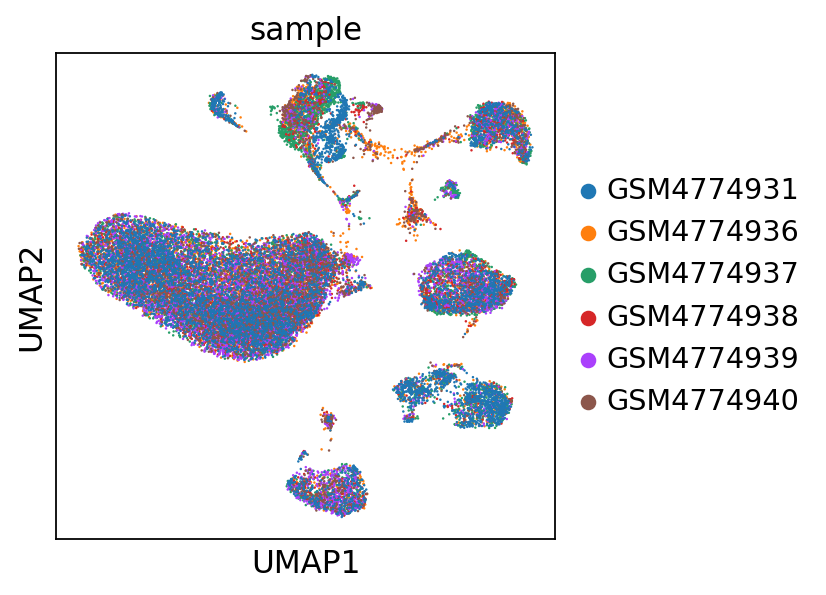

In [36]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='original_celltype', 
               use_raw=False, s=5, wspace=0.5, save='/smajic_og_celltype.png')
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='predicted_doublet', 
               use_raw=False, s=5, wspace=0.5, save='/smajic_doublet.png')
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='sample', 
               use_raw=False, s=5, wspace=0.5, save='/smajic_sample.png')

In [37]:
adata_smajic_merge_full_BC.write(os.path.join('./data/smajic_merge_base_BC.h5ad'))

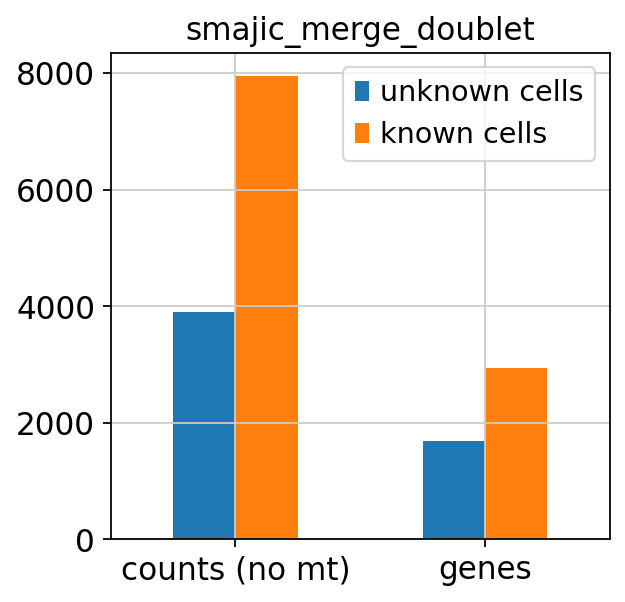

In [39]:
for i in range(numberobj):
    mean_counts_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_celltype'] =='None']['total_counts']))
    mean_genes_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_celltype'] =='None']['n_genes']))
    mean_counts = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_celltype'] !='None']['total_counts']))
    mean_genes = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_celltype'] !='None']['n_genes']))
    
    
    filtered_cells = [mean_counts_high,mean_genes_high]
    all_cells = [mean_counts,mean_genes]
    index = ['counts (no mt)', 'genes']
    
    
    df = pd.DataFrame({f'unknown cells': filtered_cells, 'known cells': all_cells}, index=index)
    
    ax = df.plot.bar(rot=0,title=names[i])